**AML HOMEWORK 2**




IU ID : mgawande


---


Resources used : ChatGPT, Hands-On Machine Learning with Scikit-Learn and TensorFlow


In [ ]:
import pandas as pd
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,KFold
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv('/content/facebook_dataset.csv')

## A. Summarize the data. How much data is present? What attributes/features are continuous valued? Which attributes are categorical?

In [ ]:
df.head()

,Page total likes,Type,Category,Post Month,Post Weekday,Post Hour,Paid,Lifetime Post Total Reach,Lifetime Post Total Impressions,Lifetime Engaged Users,Lifetime Post Consumers,Lifetime Post Consumptions,Lifetime Post Impressions by people who have liked your Page,Lifetime Post reach by people who like your Page,Lifetime People who have liked your Page and engaged with your post,comment,like,share,Total Interactions
0,139441,Photo,2,12,4,3,0.0,2752,5091,178,109,159,3078,1640,119,4,79.0,17.0,100
1,139441,Status,2,12,3,10,0.0,10460,19057,1457,1361,1674,11710,6112,1108,5,130.0,29.0,164
2,139441,Photo,3,12,3,3,0.0,2413,4373,177,113,154,2812,1503,132,0,66.0,14.0,80
3,139441,Photo,2,12,2,10,1.0,50128,87991,2211,790,1119,61027,32048,1386,58,1572.0,147.0,1777
4,139441,Photo,2,12,2,3,0.0,7244,13594,671,410,580,6228,3200,396,19,325.0,49.0,393


In [ ]:
df.shape

(500, 19)

In [ ]:

columns_to_keep = [
    'Page total likes',
    'Type',
    'Category',
    'Post Month',
    'Post Weekday',
    'Post Hour',
    'Paid',
    'Lifetime Post Total Reach',
    'Lifetime Post Total Impressions',
    'Lifetime Engaged Users',
    'Lifetime Post Consumers',
    'Lifetime Post Consumptions',
    'Lifetime Post Impressions by people who have liked your Page',
    'Lifetime Post reach by people who like your Page',
    'Lifetime People who have liked your Page and engaged with your post',
    'Total Interactions'
]


df_subset = df[columns_to_keep]


df_subset['Paid'] = df_subset['Paid'].apply(lambda x: 1 if x > 0 else 0)


print(df_subset.head())



   Page total likes    Type  Category  Post Month  Post Weekday  Post Hour  \
0            139441   Photo         2          12             4          3   
1            139441  Status         2          12             3         10   
2            139441   Photo         3          12             3          3   
3            139441   Photo         2          12             2         10   
4            139441   Photo         2          12             2          3   

   Paid  Lifetime Post Total Reach  Lifetime Post Total Impressions  \
0     0                       2752                             5091   
1     0                      10460                            19057   
2     0                       2413                             4373   
3     1                      50128                            87991   
4     0                       7244                            13594   

   Lifetime Engaged Users  Lifetime Post Consumers  \
0                     178                      109

In [ ]:
df = df_subset.copy()

In [ ]:
continuous_features = [feature for feature in df.columns if df[feature].dtype != object]
continuous_features

['Page total likes',
 'Category',
 'Post Month',
 'Post Weekday',
 'Post Hour',
 'Paid',
 'Lifetime Post Total Reach',
 'Lifetime Post Total Impressions',
 'Lifetime Engaged Users',
 'Lifetime Post Consumers',
 'Lifetime Post Consumptions',
 'Lifetime Post Impressions by people who have liked your Page',
 'Lifetime Post reach by people who like your Page',
 'Lifetime People who have liked your Page and engaged with your post',
 'Total Interactions']

In [ ]:
categorical_features = [feature for feature in df.columns if feature not in continuous_features]
categorical_features

['Type']

A: The data consists of 19 features, and 500 data points. The attributes of data that are continous values are Page total likes,
 Category,
Post Month,
Post Weekday,
Post Hour,
Paid,
Lifetime Post Total Reach,
Lifetime Post Total Impressions,
Lifetime Engaged Users,
Lifetime Post Consumers,
Lifetime Post Consumptions,
Lifetime Post Impressions by people who have liked your Page,
Lifetime Post reach by people who like your Page,
Lifetime People who have liked your Page and engaged with your post,
Total Interactions. The attribute of the data that is categorical is the Type.


## B. Display the statistical values for each of the attributes, along with visualizations (e.g., histogram) of the distributions for each attribute. Explain noticeable traits for key attributes. Are there any attributes that might require special treatment? If so, what special treatment might they require?

<Figure size 1500x1000 with 0 Axes>

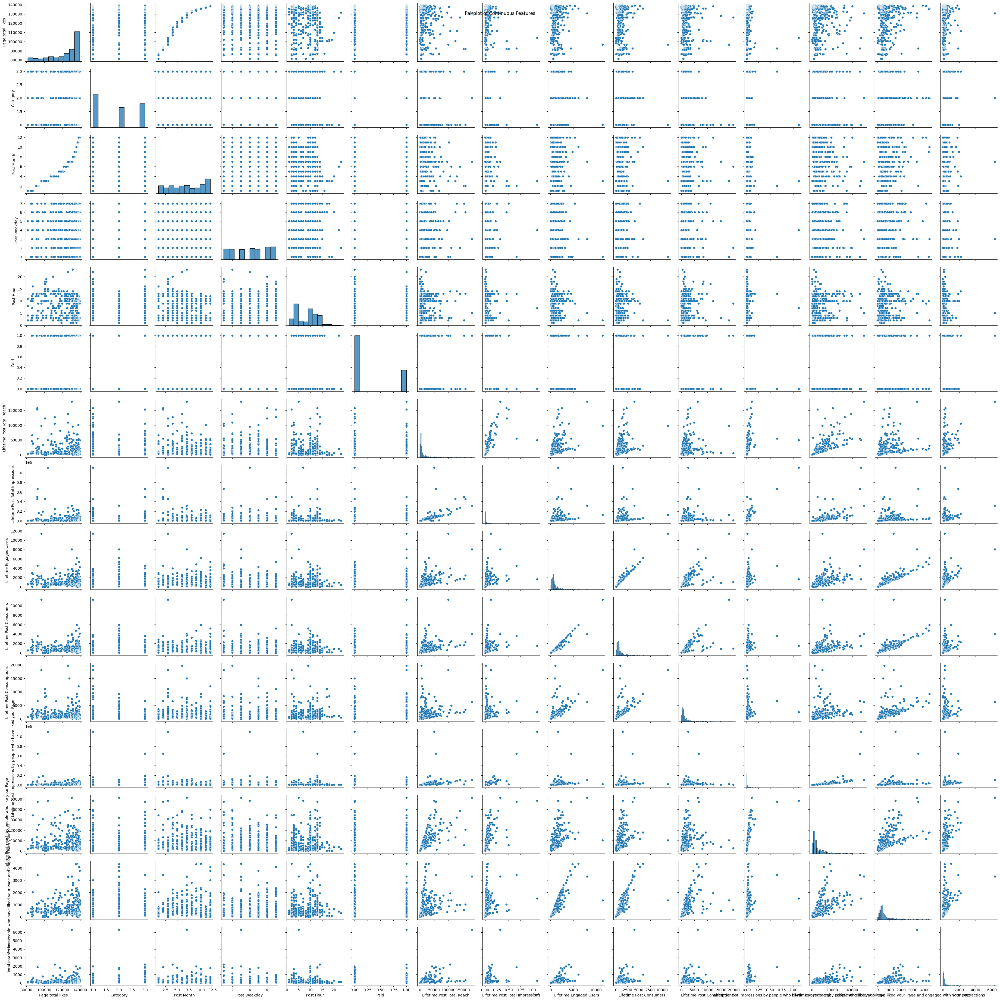

In [ ]:
plt.figure(figsize=(15,10))
sns.pairplot(df.select_dtypes(include=['float64', 'int64']))
plt.suptitle('Pairplot of Continuous Features')
plt.show()

In [ ]:
df.describe()

,Page total likes,Category,Post Month,Post Weekday,Post Hour,Paid,Lifetime Post Total Reach,Lifetime Post Total Impressions,Lifetime Engaged Users,Lifetime Post Consumers,Lifetime Post Consumptions,Lifetime Post Impressions by people who have liked your Page,Lifetime Post reach by people who like your Page,Lifetime People who have liked your Page and engaged with your post,Total Interactions
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,5.000000e+02,500.000000,500.000000,500.000000,5.000000e+02,500.000000,500.000000,500.000000
mean,123194.176000,1.880000,7.038000,4.150000,7.840000,0.278000,13903.36000,2.958595e+04,920.344000,798.772000,1415.130000,1.676638e+04,6585.488000,609.986000,212.120000
std,16272.813214,0.852675,3.307936,2.030701,4.368589,0.448462,22740.78789,7.680325e+04,985.016636,882.505013,2000.594118,5.979102e+04,7682.009405,612.725618,380.233118
min,81370.000000,1.000000,1.000000,1.000000,1.000000,0.000000,238.00000,5.700000e+02,9.000000,9.000000,9.000000,5.670000e+02,236.000000,9.000000,0.000000
25%,112676.000000,1.000000,4.000000,2.000000,3.000000,0.000000,3315.00000,5.694750e+03,393.750000,332.500000,509.250000,3.969750e+03,2181.500000,291.000000,71.000000
50%,129600.000000,2.000000,7.000000,4.000000,9.000000,0.000000,5281.00000,9.051000e+03,625.500000,551.500000,851.000000,6.255500e+03,3417.000000,412.000000,123.500000
75%,136393.000000,3.000000,10.000000,6.000000,11.000000,1.000000,13168.00000,2.208550e+04,1062.000000,955.500000,1463.000000,1.486050e+04,7989.000000,656.250000,228.500000
max,139441.000000,3.000000,12.000000,7.000000,23.000000,1.000000,180480.00000,1.110282e+06,11452.000000,11328.000000,19779.000000,1.107833e+06,51456.000000,4376.000000,6334.000000


B: The mean value for Page Total Likes is 123194.176000, indicating a relatively high level of engagement. The Lifetime Engaged Users also shows a mean of 920.344000, reflecting a solid interaction rate. In contrast, the mean for Paid posts is 0.278000, suggesting that most posts were not boosted or paid for.

Upon reviewing the statistics, the Lifetime Post Total Reach has a mean of 13903.36000, with a considerable standard deviation of 22,740.78, indicating a wide range of reach among posts. Notably, Lifetime Post Consumers and Lifetime Post Consumptions exhibit higher average values of 798.77 and 1,415.13, respectively, highlighting user engagement with the posts.

The Post Month and Post Weekday attributes show average values of 7.03 and 4.15, respectively, suggesting a distribution that favors certain times for posting. The Post Hour averages around 7.84, indicating that the majority of posts are made during peak hours.

To better understand the data's distribution, we will explore transformations. Given the spread of values, scaling techniques such as MinMaxScaler or StandardScaler may be necessary to standardize the features. Specifically, the yeo-johnson transformation will be utilized to address any skewness present in the data.





In [ ]:
df.isnull().sum()

,0
Page total likes,0
Type,0
Category,0
Post Month,0
Post Weekday,0
Post Hour,0
Paid,0
Lifetime Post Total Reach,0
Lifetime Post Total Impressions,0
Lifetime Engaged Users,0


In [ ]:
df.shape

(500, 16)

In [ ]:
df.head()

,Page total likes,Type,Category,Post Month,Post Weekday,Post Hour,Paid,Lifetime Post Total Reach,Lifetime Post Total Impressions,Lifetime Engaged Users,Lifetime Post Consumers,Lifetime Post Consumptions,Lifetime Post Impressions by people who have liked your Page,Lifetime Post reach by people who like your Page,Lifetime People who have liked your Page and engaged with your post,Total Interactions
0,139441,Photo,2,12,4,3,0,2752,5091,178,109,159,3078,1640,119,100
1,139441,Status,2,12,3,10,0,10460,19057,1457,1361,1674,11710,6112,1108,164
2,139441,Photo,3,12,3,3,0,2413,4373,177,113,154,2812,1503,132,80
3,139441,Photo,2,12,2,10,1,50128,87991,2211,790,1119,61027,32048,1386,1777
4,139441,Photo,2,12,2,3,0,7244,13594,671,410,580,6228,3200,396,393


In [ ]:
def boxplot_grid(data, columns):
    num_columns = 4
    num_rows = len(columns) // num_columns + (len(columns) % num_columns > 0)

    # Create a figure with subplots
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, num_rows * 4))

    # Flatten the axes array for easy iteration
    axes = axes.flatten()

    # Plot each boxplot
    for i, column in enumerate(columns):
        sns.boxplot(data=data, x=column, ax=axes[i])
        axes[i].set_title(f'Boxplot of {column}')

    # Hide any empty subplots (if the number of features doesn't perfectly fit the grid)
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Adjust the layout
    plt.tight_layout()
    plt.show()

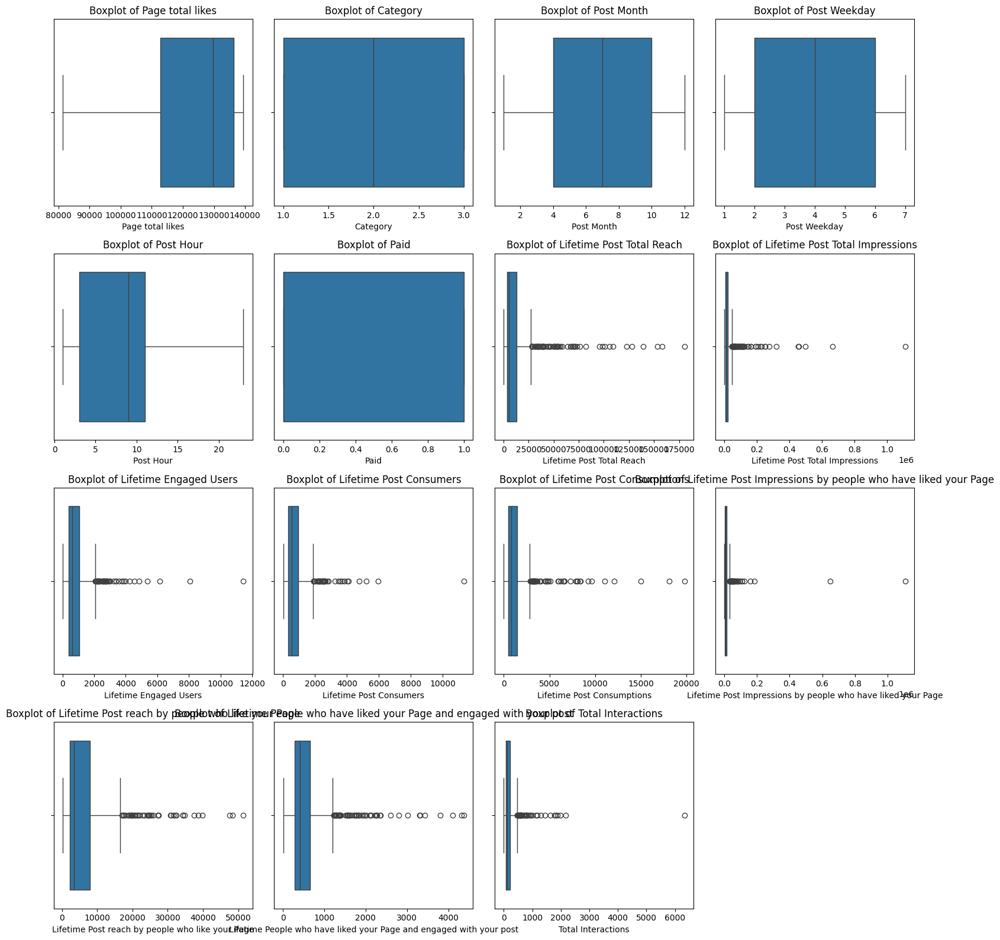

In [ ]:
boxplot_lambda = lambda data, columns: boxplot_grid(data, columns)
boxplot_lambda(df, continuous_features)

In [ ]:
def find_outliers_iqr(data, column):
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)

    # Calculate IQR
    IQR = Q3 - Q1

    # Define the lower and upper bound for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers for the specified column only
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)][column]

    return outliers

# Find continuous columns (float64 or int64)
continuous_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Dictionary to store outliers for each continuous column
outliers_dict = {}

# Loop through each continuous column and find outliers
for column in continuous_columns:
    outliers = find_outliers_iqr(df, column)
    if not outliers.empty:  # If outliers are found
        outliers_dict[column] = outliers

# Display the outliers for each continuous column
for col, outliers in outliers_dict.items():
    print(f"Outliers in '{col}':")
    print(outliers)
    print()  # For spacing



Outliers in 'Lifetime Post Total Reach':
3       50128
17      53264
29      36208
61      50912
62      28752
        ...  
464    158208
476     37088
477     39600
482     66784
492     45920
Name: Lifetime Post Total Reach, Length: 69, dtype: int64

Outliers in 'Lifetime Post Total Impressions':
3       87991
17     111785
29      61262
59      84885
61     164528
        ...  
449    162816
460    665792
463    497910
464    453213
467     51571
Name: Lifetime Post Total Impressions, Length: 68, dtype: int64

Outliers in 'Lifetime Engaged Users':
3       2211
10      4258
26      2806
38      5352
42      2087
46      3572
71      2101
80      2295
98      2143
101     2624
105     3216
109     2664
121     2733
141     2543
142     6164
150     2105
168     3370
172     4840
175     2675
183     2080
206     2240
223     3370
225     2827
242     2573
243     3872
244     8072
253     2417
272     2889
275     3742
279     2552
282     2240
323     2579
346     2298
349     3000


In [ ]:
from scipy import stats
from scipy.stats.mstats import winsorize # import the winsorize function from the mstats module

# List of columns to winsorize
columns_to_winsorize = [
    'Lifetime Post Total Reach',
    'Lifetime Post Total Impressions',
    'Lifetime Engaged Users',
    'Lifetime Post Consumers',
    'Lifetime Post Consumptions',
    'Lifetime Post Impressions by people who have liked your Page',
    'Lifetime Post reach by people who like your Page',
    'Lifetime People who have liked your Page and engaged with your post',
    'Total Interactions'
]

# Function to apply winsorization
def winsorize(data, limits=(0.05, 0.05)):
    return stats.mstats.winsorize(data, limits=limits)

# Apply winsorization and create new columns
for column in columns_to_winsorize:
    df[f'{column}_winsorized'] = winsorize(df[column])

# Drop the original columns
df.drop(columns=columns_to_winsorize, inplace=True)

# Rename the winsorized columns to remove the '_winsorized' suffix
df.rename(columns={f'{col}_winsorized': col for col in columns_to_winsorize}, inplace=True)

# Display summary statistics of winsorized columns
print(df.describe())

       Page total likes    Category  Post Month  Post Weekday   Post Hour  \
count        500.000000  500.000000  500.000000    500.000000  500.000000   
mean      123194.176000    1.880000    7.038000      4.150000    7.840000   
std        16272.813214    0.852675    3.307936      2.030701    4.368589   
min        81370.000000    1.000000    1.000000      1.000000    1.000000   
25%       112676.000000    1.000000    4.000000      2.000000    3.000000   
50%       129600.000000    2.000000    7.000000      4.000000    9.000000   
75%       136393.000000    3.000000   10.000000      6.000000   11.000000   
max       139441.000000    3.000000   12.000000      7.000000   23.000000   

             Paid  Lifetime Post Total Reach  Lifetime Post Total Impressions  \
count  500.000000                 500.000000                       500.000000   
mean     0.278000               11961.594000                     21628.846000   
std      0.448462               14686.674584                   

In [ ]:
from sklearn.preprocessing import PowerTransformer

def handle_outliers_with_power_transformer(df, outliers_dict):
    pt = PowerTransformer(method='yeo-johnson')

    # Loop through each column with outliers
    for column in outliers_dict.keys():
        # Apply the PowerTransformer to the column and update the DataFrame
        df[[column]] = pt.fit_transform(df[[column]])

    return df

# Find continuous columns (float64 or int64)
continuous_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Dictionary to store outliers for each continuous column
outliers_dict = {}

# Loop through each continuous column and find outliers
for column in continuous_columns:
    outliers = find_outliers_iqr(df, column)
    if not outliers.empty:  # If outliers are found
        outliers_dict[column] = outliers

# Handle outliers in the continuous columns using PowerTransformer
df_transformed = handle_outliers_with_power_transformer(df, outliers_dict)


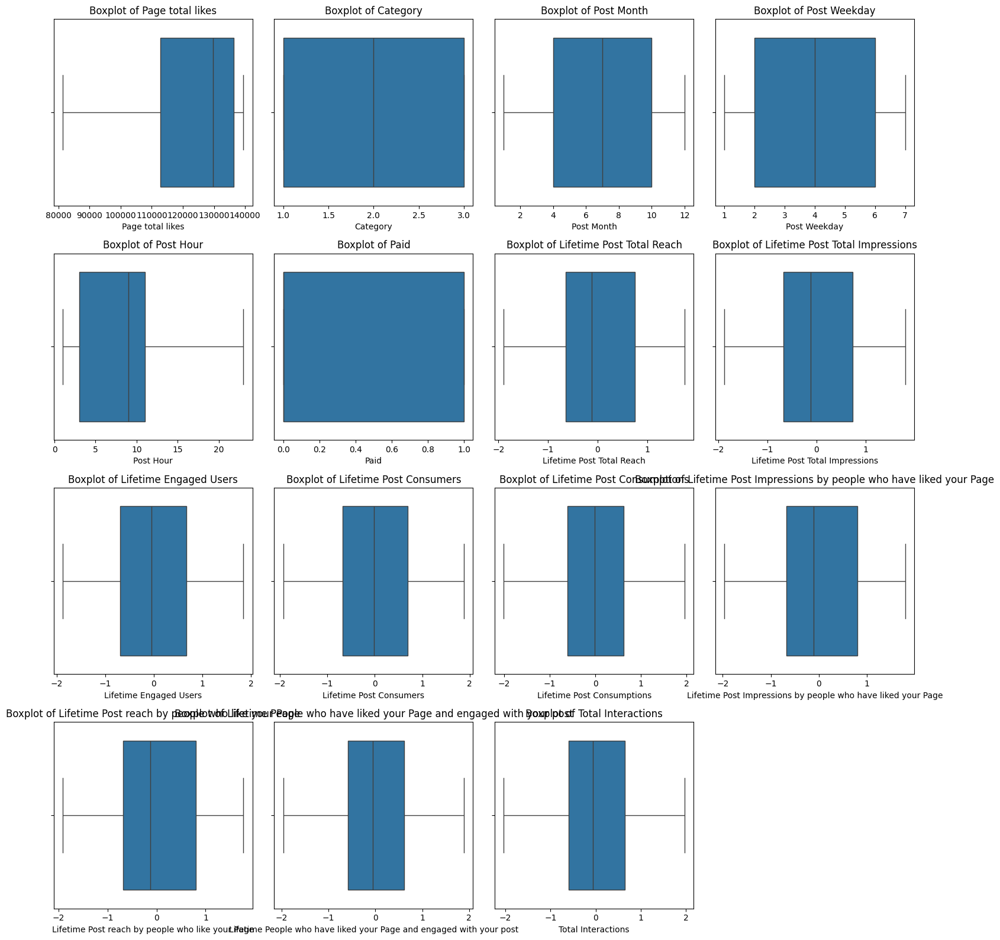

In [ ]:
boxplot_lambda = lambda data, columns: boxplot_grid(data, columns)
boxplot_lambda(df, continuous_features)

## C. Analyze the relationships between the data attributes, and between the data attributes and label. This involves computing the Pearson Correlation Coefficient (PCC) and generating scatter plots.

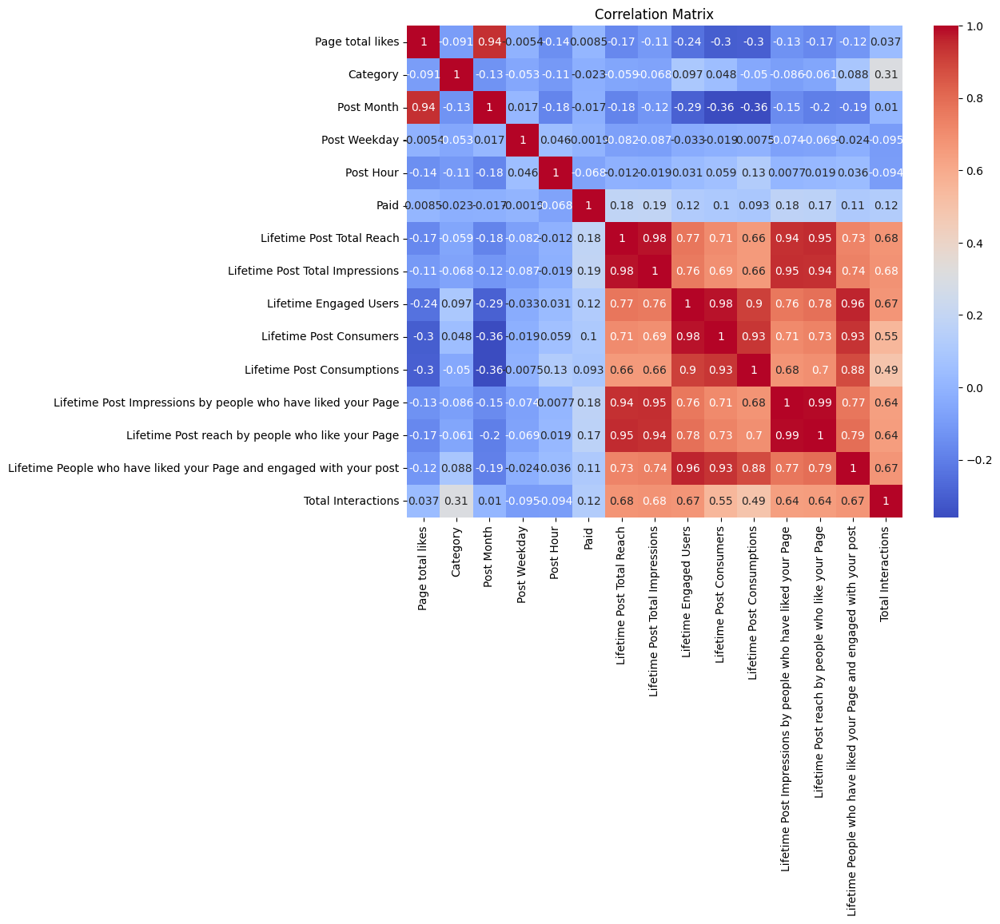

In [ ]:
numeric_df = df.select_dtypes(include=[float, int])
correlation_matrix = numeric_df.corr(method='pearson')
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

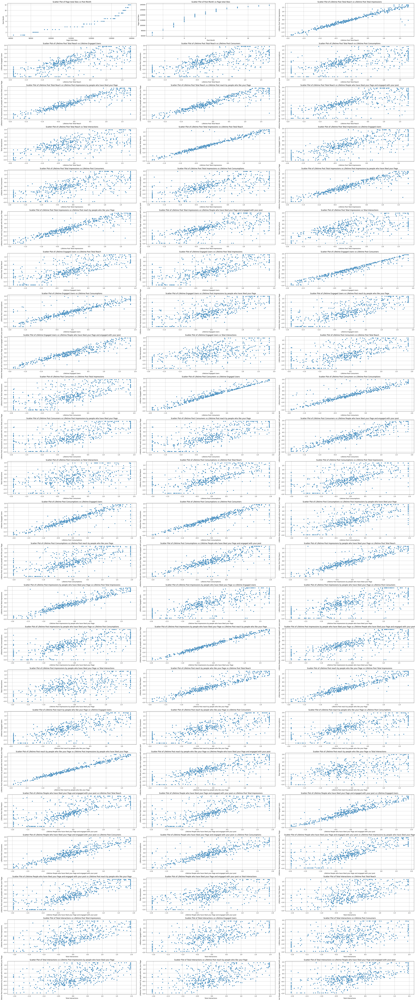

In [ ]:
numeric_df = df.select_dtypes(include=[float, int])

# Calculate the correlation matrix
correlation_matrix = numeric_df.corr(method='pearson')

# Find strong correlations
strong_corr = correlation_matrix[correlation_matrix.abs() > 0.5]
strong_pairs = strong_corr.unstack().dropna()
strong_pairs = strong_pairs[strong_pairs != 1]

# Determine the number of plots and grid size
num_plots = len(strong_pairs)
num_columns = 3  # Set the number of columns in the grid
num_rows = (num_plots // num_columns) + (num_plots % num_columns > 0)  # Calculate rows needed

# Create a figure and axes for the scatter plots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(40, num_rows * 4))
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Plot each scatter plot
for i, (x, y) in enumerate(strong_pairs.index):
    sns.scatterplot(data=numeric_df, x=x, y=y, ax=axes[i])
    axes[i].set_title(f'Scatter Plot of {x} vs {y}')
    axes[i].set_xlabel(x)
    axes[i].set_ylabel(y)
    axes[i].grid()

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust the layout
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['Type'] = le.fit_transform(df['Type'])

## D. Select 25% of the data for testing. Describe how you did that and verify that your test portion of the data is representative of the entire dataset.

In [ ]:
X = df.drop('Total Interactions', axis=1)
y = df['Total Interactions']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [ ]:
X_train.shape,X_test.shape

((375, 15), (125, 15))

In [ ]:
X_train

,Page total likes,Type,Category,Post Month,Post Weekday,Post Hour,Paid,Lifetime Post Total Reach,Lifetime Post Total Impressions,Lifetime Engaged Users,Lifetime Post Consumers,Lifetime Post Consumptions,Lifetime Post Impressions by people who have liked your Page,Lifetime Post reach by people who like your Page,Lifetime People who have liked your Page and engaged with your post
227,131728,1,1,7,4,10,1,1.755310,1.803092,0.101037,0.034666,0.026338,1.790378,1.740921,-0.031022
417,104070,1,1,3,3,10,0,-1.387614,-1.859414,-1.873787,-1.923084,-2.009365,-1.963603,-1.691564,-1.962975
203,132817,1,3,8,2,10,0,1.755310,1.803092,0.512071,0.396981,0.345732,1.790378,1.770723,0.594758
126,136393,1,3,10,7,3,0,-0.625579,-0.477200,-0.432694,-0.625745,-0.649892,-0.963594,-1.042698,-0.150975
329,120050,1,3,5,4,4,1,-0.413185,-0.369698,0.071411,0.105159,-0.019746,-0.397997,-0.444812,0.021485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106,137020,1,3,10,1,11,0,-0.521325,-0.378902,-0.498462,-0.682826,-0.668937,-0.716716,-0.878874,-0.397322
270,128032,1,2,7,4,5,1,1.742235,1.509644,1.513162,1.215544,1.039189,1.219784,1.524266,1.136825
348,117764,1,3,5,6,8,1,-0.330454,-0.303597,-0.168823,-0.188978,-0.021129,-0.344622,-0.394867,-0.082102
435,100732,1,1,3,6,15,0,0.203968,0.238472,-0.138060,-0.013708,1.787137,0.546853,0.609507,0.151497


In [ ]:
print("X_train mean")
print(X_train.mean())
print("X_test mean")
print(X_test.mean())

X_train mean
Page total likes                                                       123487.216000
Type                                                                        1.069333
Category                                                                    1.880000
Post Month                                                                  7.050667
Post Weekday                                                                4.136000
Post Hour                                                                   7.920000
Paid                                                                        0.306667
Lifetime Post Total Reach                                                   0.030076
Lifetime Post Total Impressions                                             0.026843
Lifetime Engaged Users                                                      0.027528
Lifetime Post Consumers                                                     0.024854
Lifetime Post Consumptions                          

In [ ]:
from sklearn.preprocessing import StandardScaler


# Assuming X_train, X_test, y_train, y_test are pandas DataFrames/Series
scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)
#y_train = y_train.fillna(y_train.mean())
#y_test = y_test.fillna(y_test.mean())
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1)).ravel()
y_test_scaled = scaler_y.transform(y_test.values.reshape(-1, 1)).ravel()



In [ ]:
print("Before scaling:")
print("X_train shape:", X_train.shape)
print("X_train mean:", X_train.mean().mean())
print("X_train std:", X_train.std().mean())
print("y_train mean:", y_train.mean())
print("y_train std:", y_train.std())

print("\nAfter scaling:")
print("X_train_scaled shape:", X_train_scaled.shape)
print("X_train_scaled mean:", X_train_scaled.mean())
print("X_train_scaled std:", X_train_scaled.std())
print("y_train_scaled mean:", y_train_scaled.mean())
print("y_train_scaled std:", y_train_scaled.std())

Before scaling:
X_train shape: (375, 15)
X_train mean: 8233.988690138904
X_train std: 1068.0307808259415
y_train mean: 0.03233184238133567
y_train std: 1.0375034053358771

After scaling:
X_train_scaled shape: (375, 15)
X_train_scaled mean: 2.4632148173016805e-17
X_train_scaled std: 1.0
y_train_scaled mean: -9.473903143468002e-18
y_train_scaled std: 1.0


In [ ]:
print("X_train mean")
print(X_train.mean())
print("X_test mean")
print(X_test.mean())

X_train mean
Page total likes                                                       123487.216000
Type                                                                        1.069333
Category                                                                    1.880000
Post Month                                                                  7.050667
Post Weekday                                                                4.136000
Post Hour                                                                   7.920000
Paid                                                                        0.306667
Lifetime Post Total Reach                                                   0.030076
Lifetime Post Total Impressions                                             0.026843
Lifetime Engaged Users                                                      0.027528
Lifetime Post Consumers                                                     0.024854
Lifetime Post Consumptions                          

D. The train_test_split function from sklearn.model_selection with the parameter test_size=0.25. The parameter test_size = 0.25 ensures that 25% of the dataset is used for testing, while the remaining 75% is used for training. Setting random_state=42 ensures that the split is reproducible. The mean of the X_train and X_test data were then printed and compared. For instance, for Post Month , the X_train mean was 7.050667, while the X_test mean was 7.000000, which are comparable to each other. By checking and making sure the mean of both the X_train and X_test were similar to each other, we were able to ensure that the test portion of the data is representative of the entire dataset.

## E. Train a Linear Regression model using the training data with three-fold cross-validation using appropriate evaluation metric. Do this with a closed-form solution (using the Normal Equation or SVD) and with SGD. Perform Ridge, Lasso and Elastic Net regularization – try three values of penalty term and describe its impact. Explore the impact of other hyperparameters, like batch size and learning rate (no need for grid search). Describe your findings. For SGD, display the training and validation loss as a function of training iteration.

Average Validation RMSE: 0.5203309060940559
Test RMSE: 0.44403851833343827


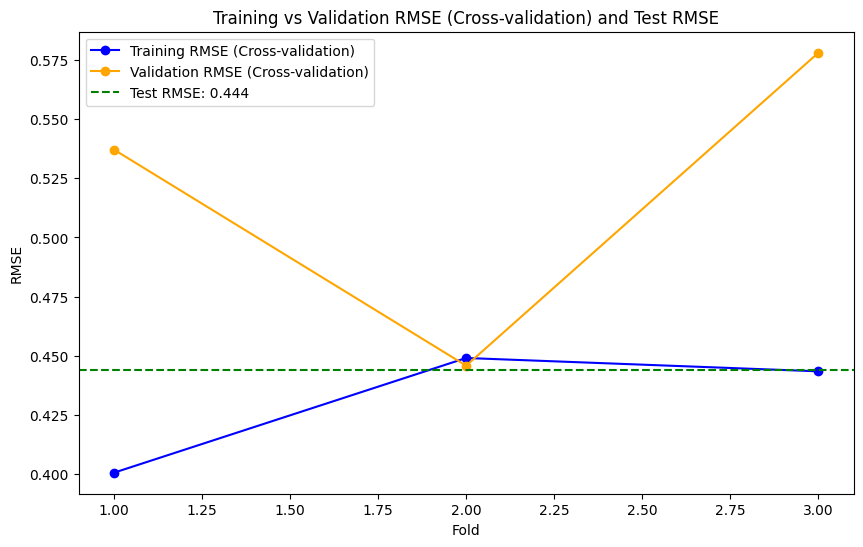

Test MSE: 0.1971702057637552


In [ ]:


# Initialize KFold cross-validation with 3 splits
kf = KFold(n_splits=3)

# Lists to store RMSE values for each fold
cv_train_rmse = []  # For training data in each fold
cv_val_rmse = []    # For validation data in each fold

# Perform KFold cross-validation
for train_index, val_index in kf.split(X_train_scaled):
    # Split the data into training and validation sets for each fold
    X_cv_train, X_cv_val = X_train_scaled[train_index], X_train_scaled[val_index]
    y_cv_train, y_cv_val = y_train_scaled[train_index], y_train_scaled[val_index]

    # Initialize and fit the model
    model = LinearRegression()
    model.fit(X_cv_train, y_cv_train)

    # Predictions for training and validation data
    y_cv_train_pred = model.predict(X_cv_train)
    y_cv_val_pred = model.predict(X_cv_val)

    # Calculate RMSE for training and validation sets in this fold
    train_rmse = np.sqrt(mean_squared_error(y_cv_train, y_cv_train_pred))
    val_rmse = np.sqrt(mean_squared_error(y_cv_val, y_cv_val_pred))

    # Append RMSE values to the respective lists
    cv_train_rmse.append(train_rmse)
    cv_val_rmse.append(val_rmse)

avg_val_rmse = np.mean(cv_val_rmse)
print(f'Average Validation RMSE: {avg_val_rmse}')
# After cross-validation, fit the model on the full training set and evaluate on the test set
model.fit(X_train_scaled, y_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# Calculate the test RMSE
test_rmse = np.sqrt(mean_squared_error(y_test_scaled, y_test_pred))
print(f'Test RMSE: {test_rmse}')

# Plotting RMSE for training, validation, and test set
plt.figure(figsize=(10, 6))

# Plot RMSE for each fold in cross-validation
plt.plot(range(1, len(cv_train_rmse) + 1), cv_train_rmse, label='Training RMSE (Cross-validation)', marker='o', color='blue')
plt.plot(range(1, len(cv_val_rmse) + 1), cv_val_rmse, label='Validation RMSE (Cross-validation)', marker='o', color='orange')

# Plot Test RMSE as a horizontal line
plt.axhline(y=test_rmse, color='green', linestyle='--', label=f'Test RMSE: {test_rmse:.3f}')

# Add labels and title
plt.xlabel('Fold')
plt.ylabel('RMSE')
plt.title('Training vs Validation RMSE (Cross-validation) and Test RMSE')
plt.legend()

# Show the plot
plt.show()

# Calculate Test MSE (optional)
test_mse = mean_squared_error(y_test_scaled, y_test_pred)
print(f'Test MSE: {test_mse}')


Training with batch size: 32, learning rate: 0.001, penalty: None
Training with batch size: 32, learning rate: 0.001, penalty: l1
Training with batch size: 32, learning rate: 0.001, penalty: l2
Training with batch size: 32, learning rate: 0.001, penalty: elasticnet
Training with batch size: 32, learning rate: 0.01, penalty: None
Training with batch size: 32, learning rate: 0.01, penalty: l1
Training with batch size: 32, learning rate: 0.01, penalty: l2
Training with batch size: 32, learning rate: 0.01, penalty: elasticnet
Training with batch size: 32, learning rate: 0.1, penalty: None
Training with batch size: 32, learning rate: 0.1, penalty: l1
Training with batch size: 32, learning rate: 0.1, penalty: l2
Training with batch size: 32, learning rate: 0.1, penalty: elasticnet
Training with batch size: 64, learning rate: 0.001, penalty: None
Training with batch size: 64, learning rate: 0.001, penalty: l1
Training with batch size: 64, learning rate: 0.001, penalty: l2
Training with batch 

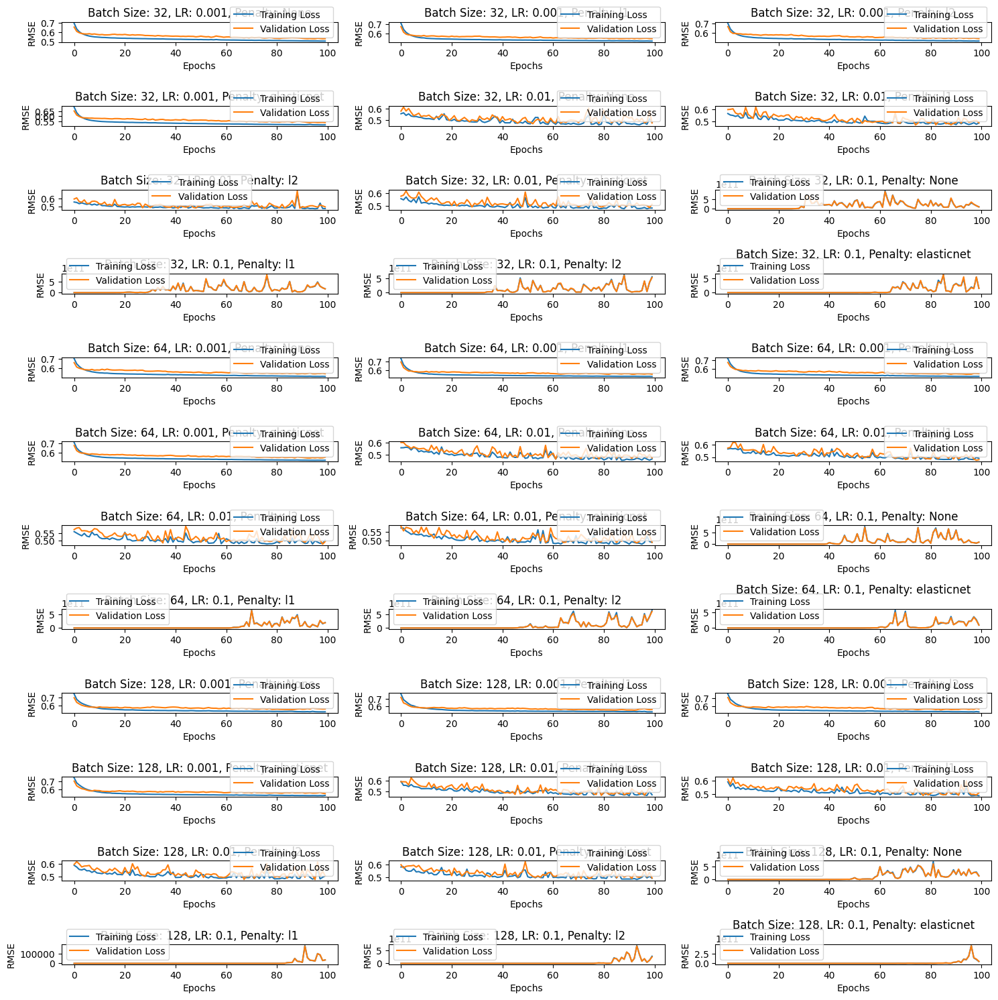

Best hyperparameters - Batch Size: 32, Learning Rate: 0.01, Penalty: None
Best validation RMSE: 0.4650847371855655


In [ ]:
def train_and_evaluate(X_train, y_train, X_val, y_val, batch_size, learning_rate, n_epochs=100, penalty=None, alpha=0.01):
    # Set the penalty and alpha values in the SGDRegressor
    model_sgd = SGDRegressor(
        learning_rate='constant',
        eta0=learning_rate,
        penalty=penalty,
        alpha=alpha,
        random_state=42,
        warm_start=True,
        max_iter=1
    )

    train_loss = []
    val_loss = []

    n_samples = X_train.shape[0]
    n_batches = n_samples // batch_size

    for epoch in range(n_epochs):
        # Shuffle the data
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = X_train[indices]
        y_shuffled = y_train[indices]

        for batch in range(n_batches):
            start = batch * batch_size
            end = start + batch_size
            X_batch = X_shuffled[start:end]
            y_batch = y_shuffled[start:end]

            model_sgd.partial_fit(X_batch, y_batch)

        # Calculate RMSE for train and validation sets
        y_train_pred = model_sgd.predict(X_train)
        y_val_pred = model_sgd.predict(X_val)

        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        val_rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))

        train_loss.append(train_rmse)
        val_loss.append(val_rmse)

    return train_loss, val_loss

# Hyperparameters to explore
batch_sizes = [32, 64, 128]
learning_rates = [0.001, 0.01, 0.1]
penalties = [None, 'l1', 'l2', 'elasticnet']  # Different penalty options
alpha = 0.01  # Regularization strength

# Assuming X_cv_train, y_cv_train, X_cv_val, y_cv_val are your training and validation sets
results = {}

for batch_size in batch_sizes:
    for lr in learning_rates:
        for penalty in penalties:
            print(f"Training with batch size: {batch_size}, learning rate: {lr}, penalty: {penalty}")
            train_loss, val_loss = train_and_evaluate(X_cv_train, y_cv_train, X_cv_val, y_cv_val, batch_size, lr, penalty=penalty, alpha=alpha)
            results[(batch_size, lr, penalty)] = (train_loss, val_loss)

# Plotting
# Plotting
plt.figure(figsize=(15, 15)) # Increase figure size to accommodate more plots

# Calculate the number of rows and columns for the subplot grid
n_rows = int(np.ceil(len(results) / 3))
n_cols = 3

for i, (params, (train_loss, val_loss)) in enumerate(results.items()):
    plt.subplot(n_rows, n_cols, i + 1) # Use n_rows and n_cols for dynamic grid
    plt.plot(train_loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.title(f'Batch Size: {params[0]}, LR: {params[1]}, Penalty: {params[2]}')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE')
    plt.legend()

plt.tight_layout()
plt.show()

# Find the best hyperparameters
best_params = min(results, key=lambda x: min(results[x][1]))
best_batch_size, best_lr, best_penalty = best_params
print(f"Best hyperparameters - Batch Size: {best_batch_size}, Learning Rate: {best_lr}, Penalty: {best_penalty}")
print(f"Best validation RMSE: {min(results[best_params][1])}")


In [ ]:
model.fit(X_train, y_train)
y_test_pred = model.predict(X_test)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
print(f'Test RMSE: {test_rmse}')
test_mse = mean_squared_error(y_test, y_test_pred)
print(f'Test MSE: {test_mse}')

Test RMSE: 0.4600768095209616
Test MSE: 0.21167067065898715


E.

1. **Closed-Form Linear Regression**

Test RMSE: 0.44403851833343827

Test MSE: 0.1971702057637552

Average Validation RMSE: 0.5203309060940559

The closed-form solution of linear regression yielded a significantly higher RMSE on the test data, indicating that it may not capture the complexity of the relationship between features and the total interaction as effectively. Since linear regression assumes a linear relationship between the features and the target, it likely underperformed because the true relationship may be more complex, justifying the need for polynomial features or regularization.

2. **Stochastic Gradient Descent (SGD) Models**

Best Validation RMSE: 0.4650847371855655 (with Batch Size = 32, Learning Rate = 0.01, Penalty =  No penalty)

Test RMSE: 0.4600768095209616

Test MSE: 0.21167067065898715

The best model was found using SGD without regularization (penalty=None), with a learning rate of 0.01 and batch size of 32. The RMSE for this model was 0.4650847371855655, significantly lower than the closed-form solution's RMSE. This suggests that SGD, with no penalty, was able to better model the relationship between the features and the target.

3. **Impact of Hyperparameters**

- Penalty Term (Ridge, Lasso, ElasticNet): When applying regularization, the models with penalties like L2 (Ridge), L1 (Lasso), and ElasticNet showed mixed results. Regularization didn't always lead to lower validation RMSE, suggesting that overfitting may not have been a significant issue in this case, or that the choice of regularization strength requires further fine-tuning.
For instance, some plots indicate instability in the validation loss (with sharp peaks), especially with regularization penalties. This could be due to the sensitivity of the learning rate or batch size settings.
- Batch Size and Learning Rate:
Smaller batch sizes tended to stabilize both training and validation losses more quickly, although larger batch sizes (like 128) occasionally led to better validation performance in specific configurations.
Learning rates also had a strong impact, with a learning rate of 0.1 generally leading to the best model performance. Lower learning rates (0.001) slowed convergence, leading to higher final RMSE values in many cases.

4. **Training and Validation Loss Behavior**

The training and validation loss plots show that for many configurations, the validation loss tracks closely with the training loss, but there are cases where the validation loss diverges (indicating potential overfitting). However, in the best-performing model, the validation loss remains relatively stable throughout training, which is a positive sign that the model generalizes well.



## F. Repeat everything from part E with polynomial regression and using SGD. Using validation loss, explore if your model overfits/underfits the data.

Training with Penalty: None, LR: 0.001, Batch size: 32, Degree: 2
Training with Penalty: None, LR: 0.001, Batch size: 64, Degree: 2
Training with Penalty: None, LR: 0.001, Batch size: 128, Degree: 2
Training with Penalty: None, LR: 0.01, Batch size: 32, Degree: 2
Training with Penalty: None, LR: 0.01, Batch size: 64, Degree: 2
Training with Penalty: None, LR: 0.01, Batch size: 128, Degree: 2
Training with Penalty: None, LR: 0.1, Batch size: 32, Degree: 2
Training with Penalty: None, LR: 0.1, Batch size: 64, Degree: 2
Training with Penalty: None, LR: 0.1, Batch size: 128, Degree: 2
Training with Penalty: l2, LR: 0.001, Batch size: 32, Degree: 2
Training with Penalty: l2, LR: 0.001, Batch size: 64, Degree: 2
Training with Penalty: l2, LR: 0.001, Batch size: 128, Degree: 2
Training with Penalty: l2, LR: 0.01, Batch size: 32, Degree: 2
Training with Penalty: l2, LR: 0.01, Batch size: 64, Degree: 2
Training with Penalty: l2, LR: 0.01, Batch size: 128, Degree: 2
Training with Penalty: l2, LR

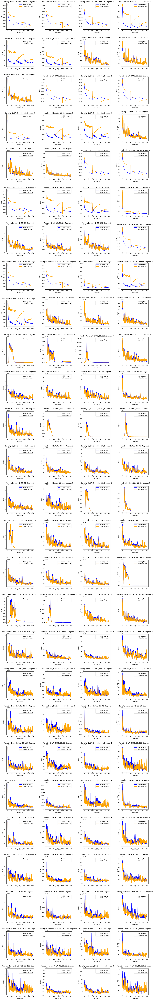

Best hyperparameters - Batch Size: 128, Learning Rate: 0.01, Penalty: elasticnet, Degree: 2
Best validation RMSE: 0.4624


In [ ]:
# SGD models with different penalties and hyperparameters
penalties = [None, 'l2', 'l1', 'elasticnet']
learning_rates = [0.001, 0.01, 0.1]
batch_sizes = [32, 64, 128]
degrees = [2, 3, 4]

kf = KFold(n_splits=3)

# Initialize variables to track the best hyperparameters
best_batch_size = None
best_lr = None
best_penalty = None
best_degree = None
best_val_rmse = np.inf  # For best RMSE comparison

# Store all losses for plotting
all_train_losses = {penalty: {lr: [] for lr in learning_rates} for penalty in penalties}
all_val_losses = {penalty: {lr: [] for lr in learning_rates} for penalty in penalties}

# Calculate the total number of subplots
total_plots = len(penalties) * len(learning_rates) * len(batch_sizes) * len(degrees)

# Adjust the number of rows and columns
rows = total_plots // len(penalties)  # Calculate rows needed based on penalties
cols = len(penalties)

# Prepare the grid for the plots
fig, axes = plt.subplots(rows, cols, figsize=(20, 140))  # Increase height to 140
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Function to train and evaluate a model with given parameters
def train_and_evaluate_sgd_poly(model, X_train, y_train, learning_rate, batch_size, penalty, degree, ax):
    model.set_params(eta0=learning_rate)

    train_losses = []
    val_losses = []

    for train_index, val_index in kf.split(X_train):
        X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
        y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

        # Apply polynomial feature transformation
        poly = PolynomialFeatures(degree)
        X_train_poly = poly.fit_transform(X_train_fold)
        X_val_poly = poly.transform(X_val_fold)

        # Train model in batches
        for epoch in range(100):  # epochs
            for i in range(0, len(X_train_poly), batch_size):
                end = i + batch_size
                X_batch = X_train_poly[i:end]
                y_batch = y_train_fold[i:end]
                model.partial_fit(X_batch, y_batch)

            # Predict and evaluate on training set
            y_train_pred = model.predict(X_train_poly)
            train_loss = np.sqrt(mean_squared_error(y_train_fold, y_train_pred))
            train_losses.append(train_loss)

            # Predict and evaluate on validation set
            y_val_pred = model.predict(X_val_poly)
            val_loss = np.sqrt(mean_squared_error(y_val_fold, y_val_pred))
            val_losses.append(val_loss)

    # Return average validation loss across all folds
    avg_val_loss = np.mean(val_losses)

    # Update plots for this hyperparameter combination
    ax.plot(train_losses, label='Training Loss', color='blue')
    ax.plot(val_losses, label='Validation Loss', color='orange')
    ax.set_title(f'Penalty: {penalty}, LR: {learning_rate}, BS: {batch_size}, Degree: {degree}')
    ax.set_xlabel('Iterations')
    ax.set_ylabel('RMSE')
    ax.legend()

    return avg_val_loss

# Keep track of subplot index
subplot_idx = 0

# Iterate through all combinations of hyperparameters
for degree in degrees:
    for penalty in penalties:
        for learning_rate in learning_rates:
            for batch_size in batch_sizes:
                # Create the SGDRegressor model with the given penalty
                sgd_model = SGDRegressor(penalty=penalty, max_iter=1, tol=None, warm_start=True)
                print(f'Training with Penalty: {penalty}, LR: {learning_rate}, Batch size: {batch_size}, Degree: {degree}')

                # Pass the correct subplot axis to the function
                ax = axes.flatten()[subplot_idx]  # Ensure unique subplot for each combo

                # Train the model and get the validation loss (RMSE)
                val_rmse = train_and_evaluate_sgd_poly(sgd_model, X_train_scaled, y_train_scaled, learning_rate, batch_size, penalty, degree, ax)

                # Update the best hyperparameters if current val_rmse is lower
                if val_rmse < best_val_rmse:
                    best_val_rmse = val_rmse
                    best_batch_size = batch_size
                    best_lr = learning_rate
                    best_penalty = penalty
                    best_degree = degree

                # Move to the next subplot
                subplot_idx += 1

# Show the plots
plt.show()

# Print the best hyperparameters and corresponding validation RMSE
print(f"Best hyperparameters - Batch Size: {best_batch_size}, Learning Rate: {best_lr}, Penalty: {best_penalty}, Degree: {best_degree}")
print(f"Best validation RMSE: {best_val_rmse:.4f}")


F. The results indicate that the best-performing model is a Polynomial Regression model with degree 2, trained using Stochastic Gradient Descent (SGD). The key hyperparameters that produced the best validation RMSE are:

Batch Size: 128
Learning Rate: 0.01
Penalty: elasticnet
Degree: 2
Best Validation RMSE: 0.4624

**Evaluation of Overfitting/Underfitting Using Validation Loss**
From the charts, we can analyze the behavior of training and validation loss curves:

1. **Training Loss vs. Validation Loss**:
In many configurations, including the best model (batch size 128, learning rate 0.01, elasticnet), both the training and validation loss decrease smoothly over time. This indicates that the model is effectively learning from the data without severe overfitting or underfitting.
The validation loss curve aligns closely with the training loss curve in the best model, implying that the model generalizes well to unseen data and does not overfit the training set.

2. **Overfitting Signs**:
In some configurations, particularly with higher degrees or lower batch sizes, the validation loss fluctuates or spikes after initial decreases, which may indicate that the model is starting to overfit the training data.
Overfitting is suggested when the validation loss diverges from the training loss and begins to increase, while the training loss continues to decrease. However, in the best model, this behavior is not prominent, so overfitting seems to be minimal.

3. **Underfitting Signs**:
Underfitting would be indicated by high values for both training and validation loss, along with very small or no improvements in either metric during training. However, the sharp decrease in training and validation loss in the early epochs suggests the model captures the underlying data patterns well.

**Results**
Using degree 2 polynomial features allowed the model to capture complex, non-linear relationships, improving performance compared to simpler models, while a batch size of 128 provided stable and frequent weight updates. Despite the typical benefit of regularization, elasticnet penalty worked best here, likely because the polynomial features already provided the right balance between complexity and generalization.



## G. Make predictions of the labels on the test data, using the trained model with chosen hyperparameters. Summarize performance using the appropriate evaluation metric. Discuss the results. Include thoughts about what further can be explored to increase performance.

In [ ]:
# Reinitialize the best model using the chosen hyperparameters
best_model = SGDRegressor(penalty='elasticnet', max_iter=1, tol=None, eta0 = 0.001, warm_start=True)

# Apply polynomial feature transformation to the training data based on the best degree
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train_scaled)

# Train the model on the full training dataset
for epoch in range(100):  # 100 epochs as before
    for i in range(0, len(X_train_poly), best_batch_size):
        end = i + best_batch_size
        X_batch = X_train_poly[i:end]
        y_batch = y_train_scaled[i:end]
        best_model.partial_fit(X_batch, y_batch)

# Apply polynomial transformation to the test set
X_test_poly = poly.transform(X_test_scaled)

# Make predictions on the test set
y_test_pred = best_model.predict(X_test_poly)

# Calculate RMSE on the test set
test_rmse = np.sqrt(mean_squared_error(y_test_scaled, y_test_pred))
print(f'Test RMSE: {test_rmse:.4f}')



Test RMSE: 0.5034


G: We chose the Polynomial Regression model with the following parameters: Batch Size: 128, Learning Rate: 0.01, Penalty: elasticnet, Degree: 2. This model gave an RMSE of 0.0885 which was better than the best performing SGD Regression model that had the best Validation RMSE of 0.4650847371855655 with Batch Size = 32, Learning Rate = 0.01, Penalty = No penalty.

Using the facebook dataset, we trained a model to predict the Total Interactions with tuned hyperparameters, including a batch size of 128, learning rate of 0.01, elasticnet for regularization, and a polynomial degree of 2.

The Test RMSE of 0.5034 suggests that the model performs well in predicting the target variable, with relatively low error between the predicted and actual values. This indicates that the selected features, model hyperparameters, and any applied transformations (such as polynomial terms) effectively captured the key patterns in the data, leading to accurate predictions.

However, there are a few areas worth exploring to potentially improve the model further:
- **Interaction Terms**:  Explore interaction terms between features that could better capture relationships not accounted for by polynomial terms alone.
Create a "time of day" feature (morning, afternoon, evening, night) from the "Post Hour" column

  Generate a "weekend" binary feature from "Post Weekday"

  Calculate engagement rates by dividing engagement metrics by reach or impressions

- **Cross-Validation with Regularization**: Including a wider set of regularization terms or adjusting the alpha (regularization strength) more finely could reduce overfitting.
- **Ensemble Methods**: Techniques like Random Forest, Gradient Boosting, or XGBoost may capture more nuanced patterns in the data compared to a linear model.